In [11]:
import matplotlib.pyplot as plt
import os
import numpy as np
import pandas as pd
import sys
import shutil
import cv2

import rasterio

import joblib

import seaborn as sns
# from scipy.signal import medfilt
from scipy.ndimage import median_filter

In [4]:
import skimage
from skimage.color import rgb2gray
from skimage.filters import gaussian

In [6]:
def reshape_split(image, kernel_size):
    img_height, img_width = image.shape
    tile_height, tile_width = kernel_size
    
    tiled_array = image.reshape(img_height // tile_height,
                               tile_height,
                               img_width // tile_width,
                               tile_width)
    tiled_array = tiled_array.swapaxes(1,2)
    return tiled_array

In [17]:
def inshore_offshore_classifier(img, clf):
    """
    Takes in an image and classifies it as either offshore(1) or inshore(0)
    """

    
    img_vals = np.copy(img)
    img_50 = np.percentile(img_vals,50)
    img_80 = np.percentile(img_vals,80)
    img_90 = np.percentile(img_vals,90)
    img_30 = np.percentile(img_vals,30)
    
    features = np.array([[img_50, img_80, img_90, img_30]])
    return clf.predict(features)

In [25]:
sub_imgs = []
preds = []

In [26]:
# load in model
clf = joblib.load("inshore_offshore_clf_normal_model.pkl")

# loop thru full imgs and split them up
full_img_fp = r'/home/snng/SAR-satelite-image-ship-detection/data_down/gee_data/full_img'
fnames = os.listdir(full_img_fp)

for file in fnames:
    file_fp = r'/home/snng/SAR-satelite-image-ship-detection/data_down/gee_data/full_img/{}'.format(file)
    with rasterio.open(file_fp) as src:
        img_array = src.read()[0]

    img_height, img_width = img_array.shape

    # get next biggest multiple of 800
    new_height = img_height + (800 - img_height % 800)
    new_width = img_width + (800 - img_width % 800)

    # resize
    reshaped = cv2.resize(img_array, (new_height, new_width))

    # for some reason have to rescale or else when saving image it will be dark
    rescaled = a_scaled = 255*(reshaped-reshaped.min())/(reshaped.max()-reshaped.min())
    
    # normalize between 0 and 1
    rescale_normalized = rescaled / 255
    
    # split image into subimages
        # will return array [m, n, 800, 800] where there are an m x n number of images with size 800x800 
    split = reshape_split(rescale_normalized, kernel_size=(800,800))

    m = split.shape[0]
    n = split.shape[1]
    

    for i in range(m):
        for j in range(n):
            preds.append(inshore_offshore_classifier(split[i][j], clf)[0])
            sub_imgs.append(split[i][j])

In [34]:
sub_imgs[0]

array([[0.41570757, 0.42946826, 0.44716081, ..., 0.51265392, 0.55239165,
        0.57653937],
       [0.41859446, 0.42825869, 0.44624294, ..., 0.51886761, 0.55638267,
        0.58224747],
       [0.42112529, 0.42560088, 0.44547163, ..., 0.52284785, 0.55915051,
        0.58977444],
       ...,
       [0.34639531, 0.3708996 , 0.39125465, ..., 0.32952254, 0.32734228,
        0.32784136],
       [0.30241254, 0.34876651, 0.38799623, ..., 0.30428133, 0.30781368,
        0.32428981],
       [0.28678955, 0.32823678, 0.38255698, ..., 0.28519966, 0.30096764,
        0.32189674]])

prediction:  1


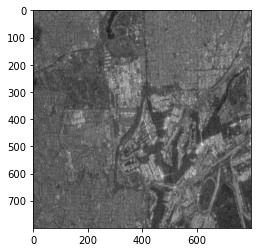

prediction:  1


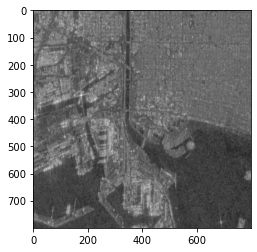

prediction:  1


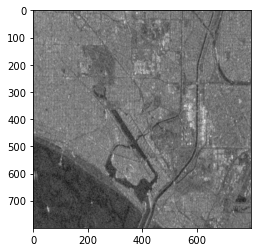

prediction:  1


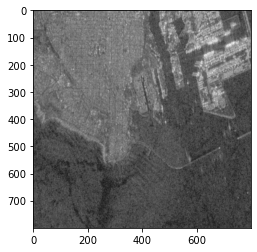

prediction:  1


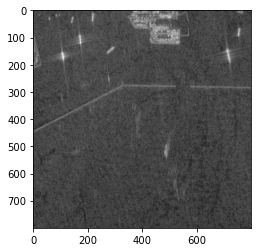

prediction:  1


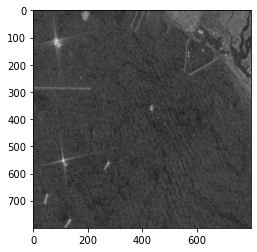

prediction:  1


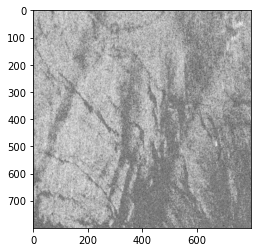

prediction:  1


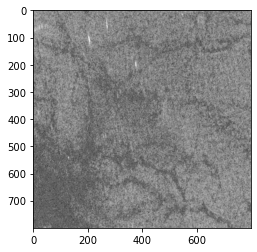

prediction:  1


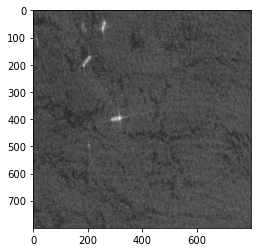

prediction:  1


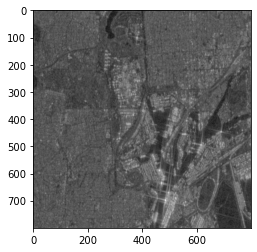

prediction:  1


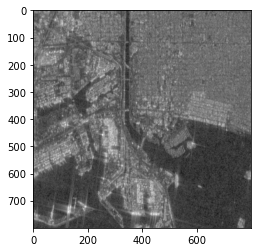

prediction:  1


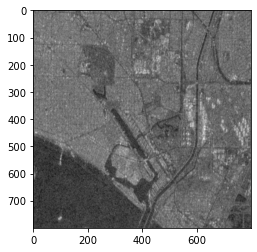

prediction:  1


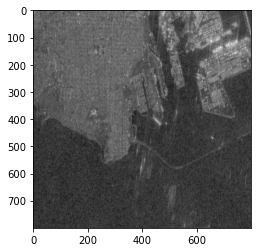

prediction:  1


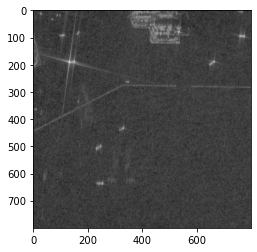

prediction:  1


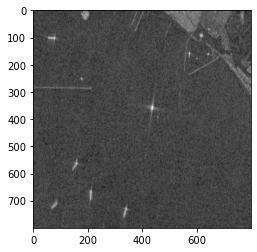

prediction:  1


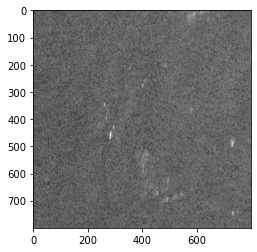

prediction:  1


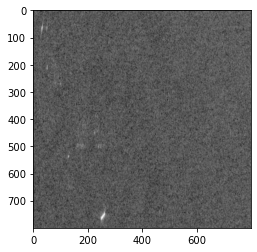

prediction:  1


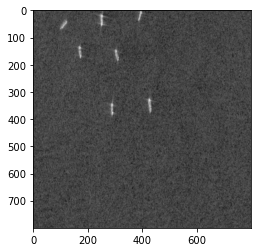

prediction:  1


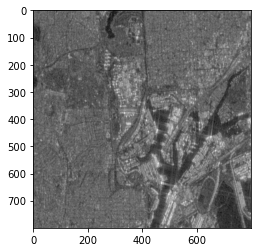

prediction:  1


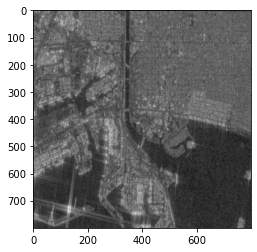

prediction:  1


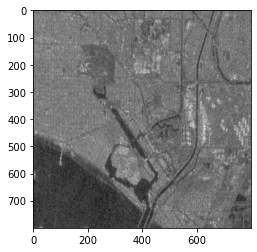

prediction:  0


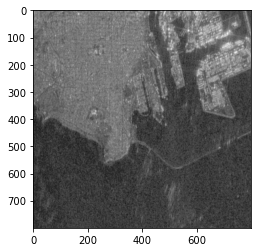

prediction:  1


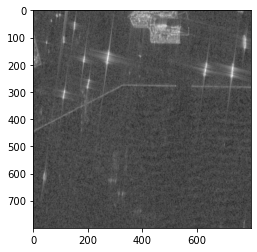

prediction:  1


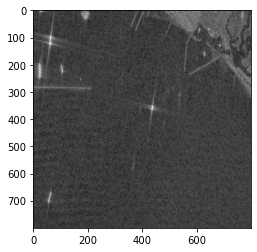

prediction:  1


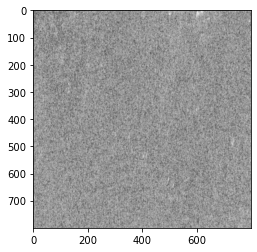

prediction:  1


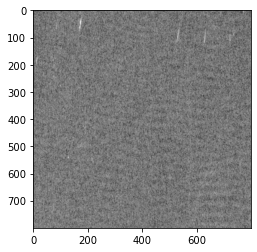

prediction:  1


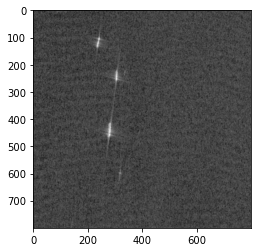

prediction:  1


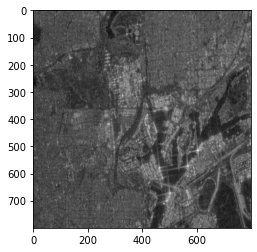

prediction:  1


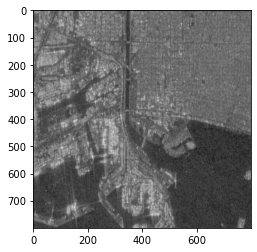

prediction:  1


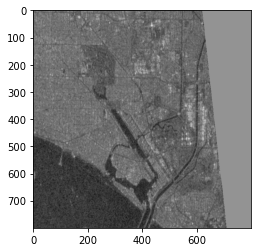

prediction:  1


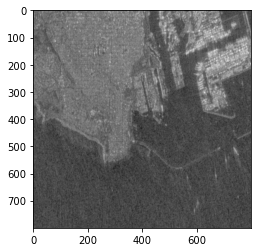

prediction:  1


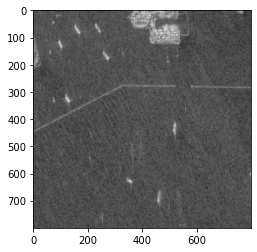

prediction:  1


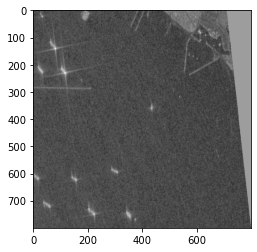

prediction:  1


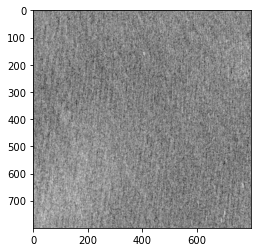

prediction:  1


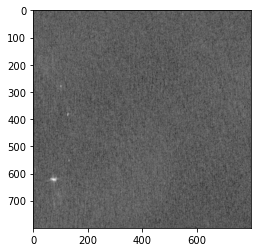

prediction:  1


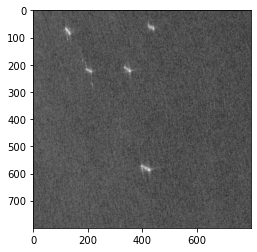

prediction:  1


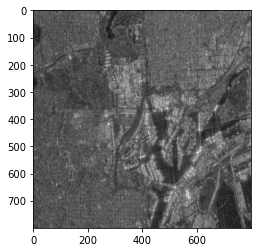

prediction:  1


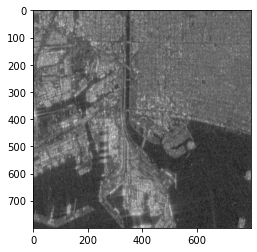

prediction:  1


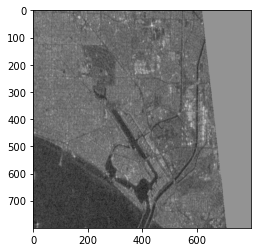

prediction:  0


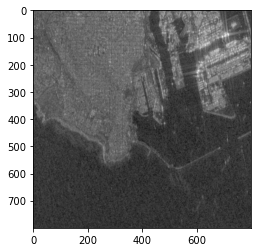

prediction:  1


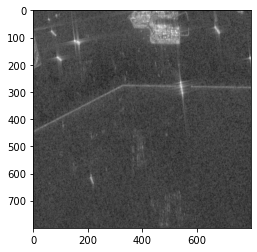

prediction:  1


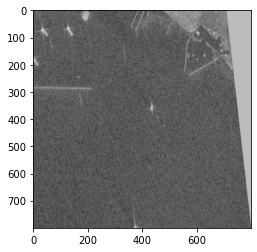

prediction:  1


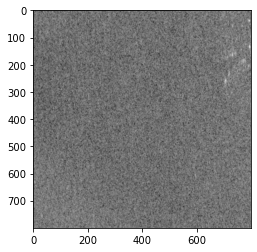

prediction:  1


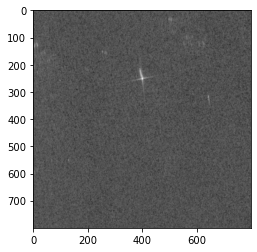

prediction:  1


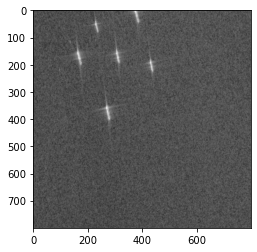

prediction:  1


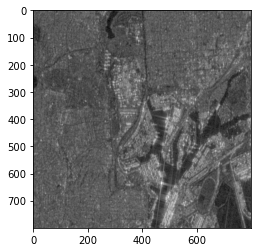

prediction:  1


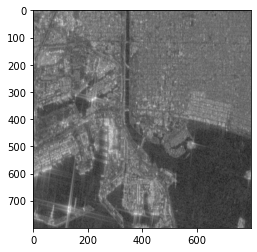

prediction:  1


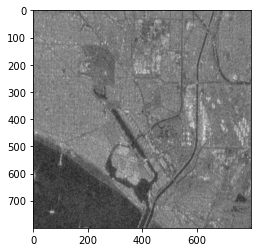

prediction:  1


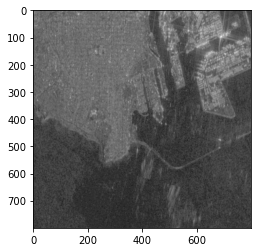

prediction:  1


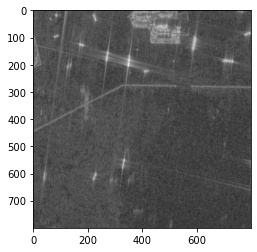

prediction:  1


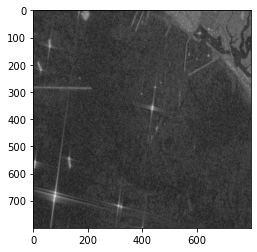

prediction:  1


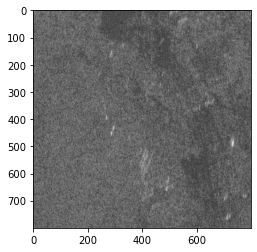

prediction:  1


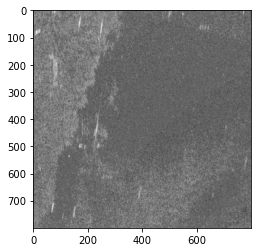

prediction:  1


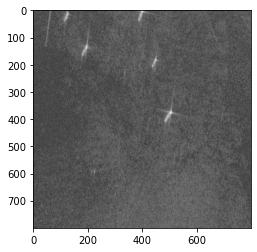

prediction:  1


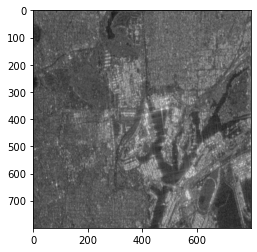

prediction:  1


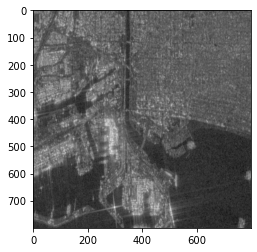

prediction:  1


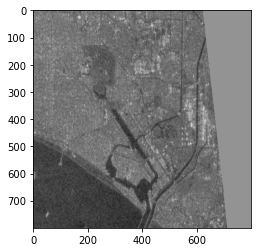

prediction:  1


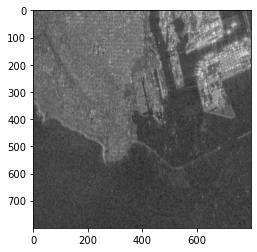

prediction:  1


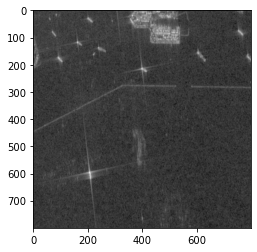

prediction:  1


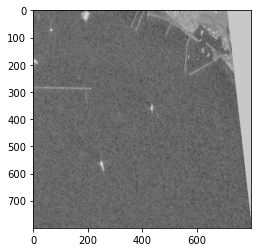

prediction:  1


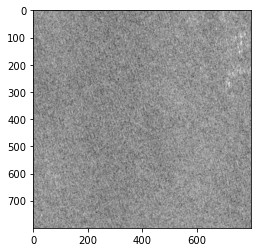

prediction:  1


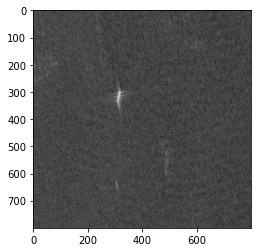

prediction:  1


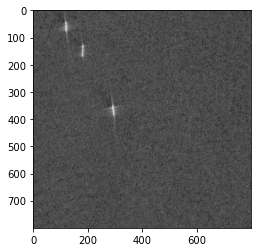

prediction:  1


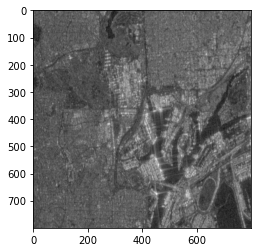

prediction:  1


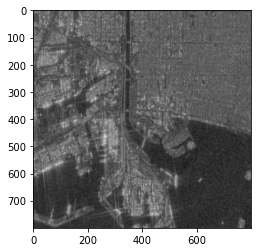

prediction:  1


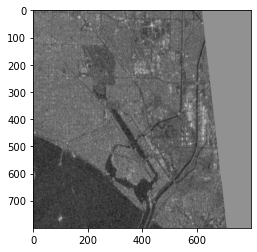

prediction:  1


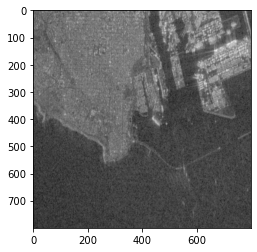

prediction:  1


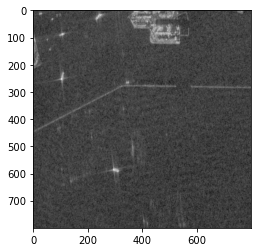

prediction:  1


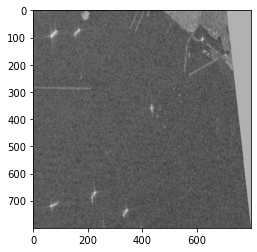

prediction:  1


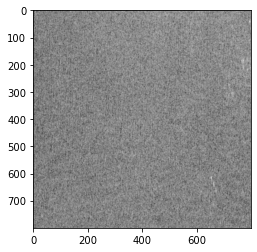

prediction:  1


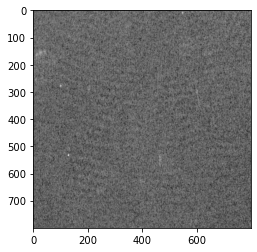

prediction:  1


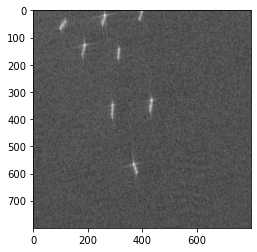

prediction:  1


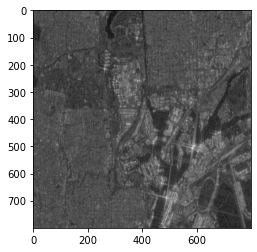

prediction:  1


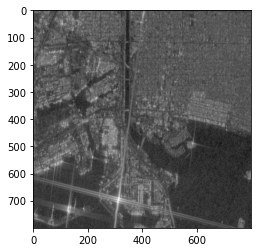

prediction:  1


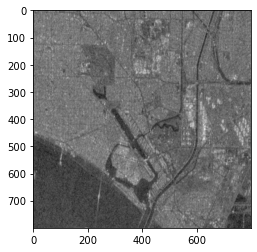

prediction:  1


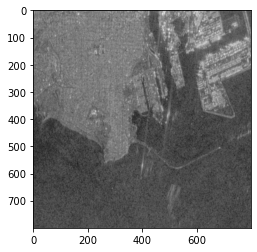

prediction:  1


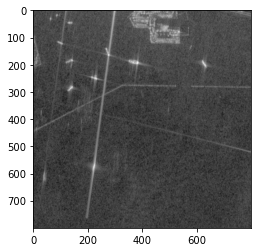

prediction:  1


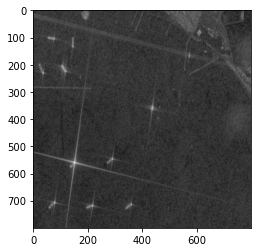

prediction:  1


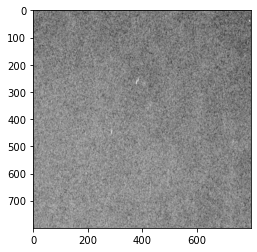

prediction:  1


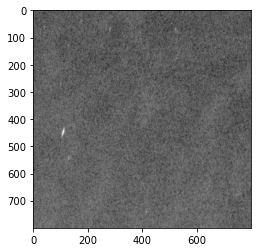

prediction:  1


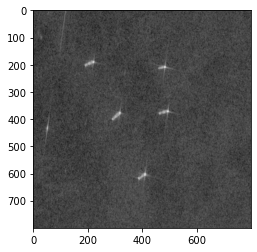

prediction:  1


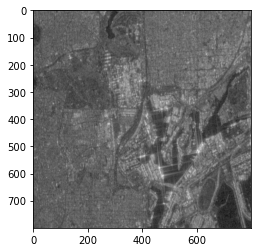

prediction:  1


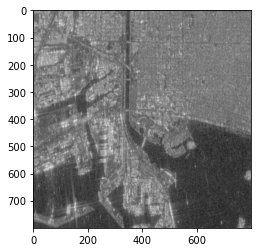

prediction:  1


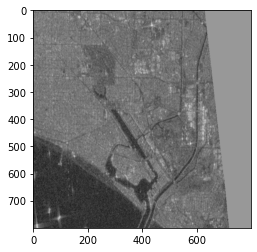

prediction:  0


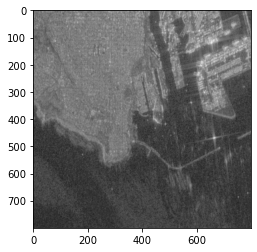

prediction:  1


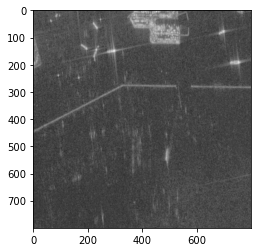

prediction:  1


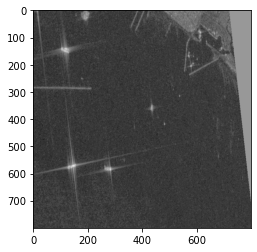

prediction:  1


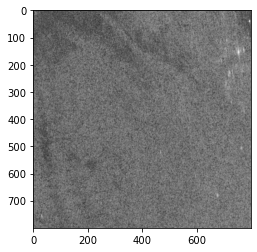

prediction:  1


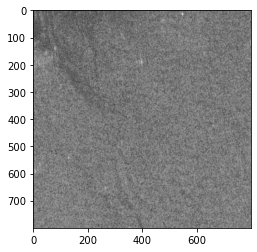

prediction:  1


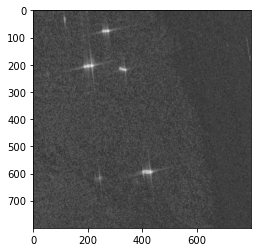

prediction:  1


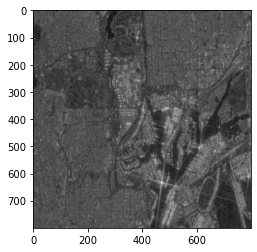

prediction:  1


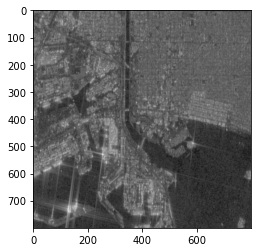

prediction:  1


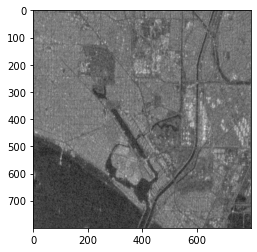

prediction:  0


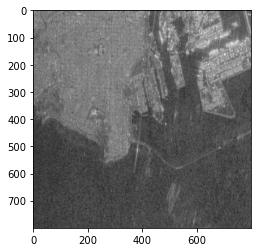

prediction:  1


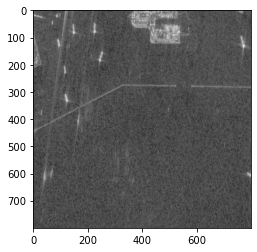

prediction:  1


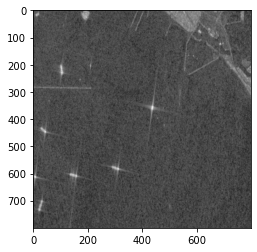

prediction:  1


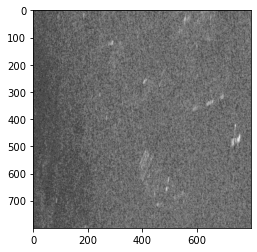

prediction:  1


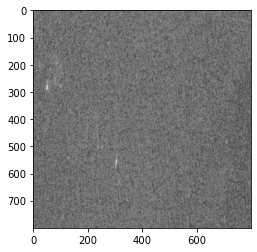

prediction:  1


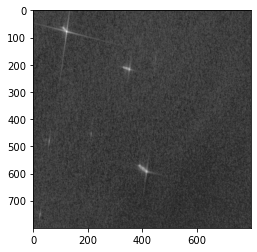

prediction:  1


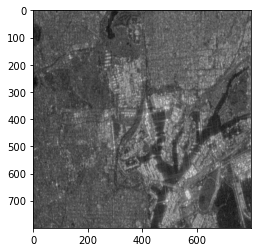

prediction:  1


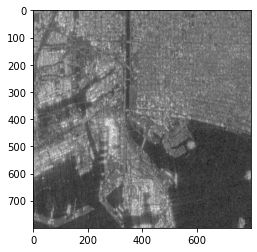

prediction:  1


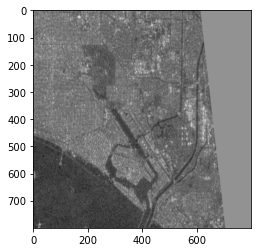

prediction:  1


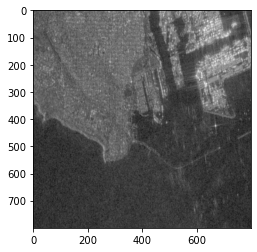

prediction:  1


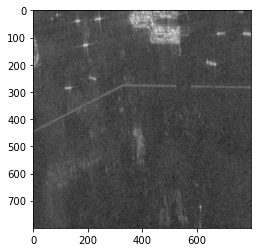

prediction:  1


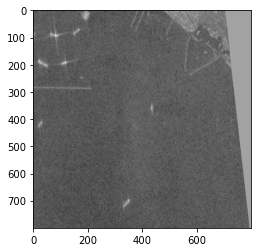

prediction:  1


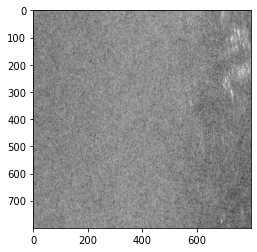

prediction:  1


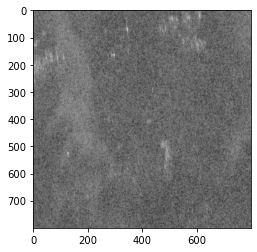

prediction:  1


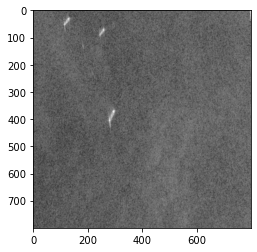

prediction:  1


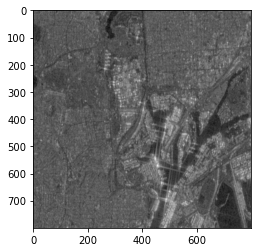

prediction:  1


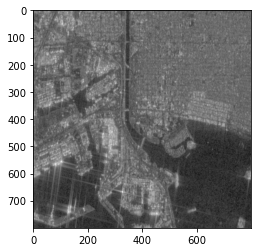

prediction:  1


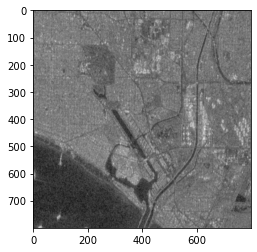

prediction:  0


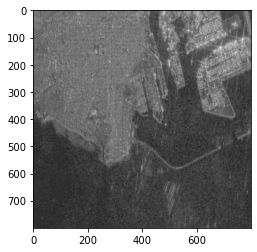

prediction:  1


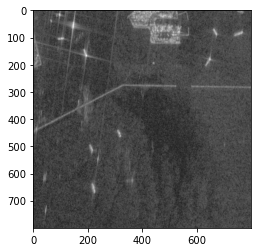

prediction:  1


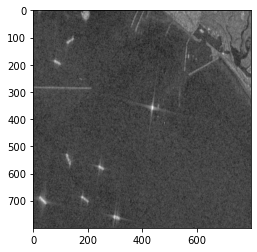

prediction:  1


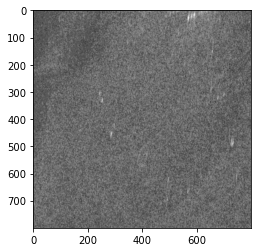

prediction:  1


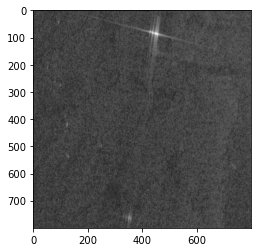

prediction:  1


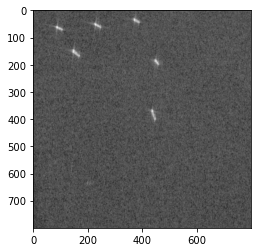

prediction:  1


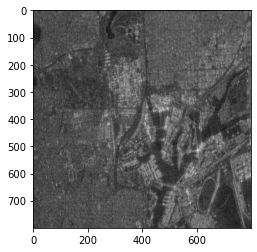

prediction:  1


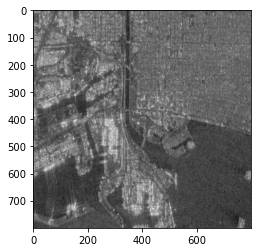

prediction:  1


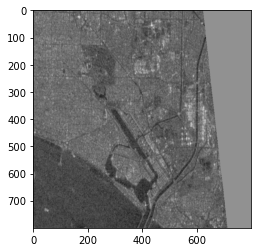

prediction:  1


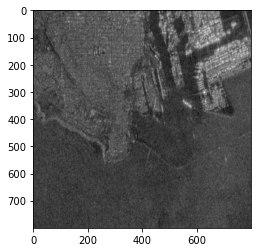

prediction:  1


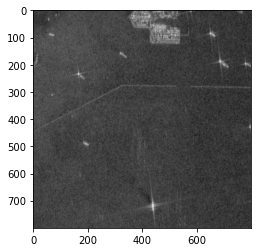

prediction:  1


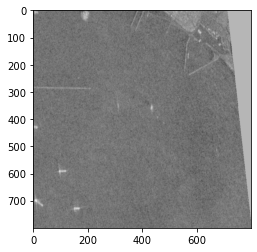

prediction:  1


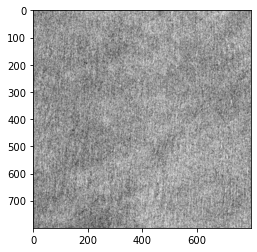

prediction:  1


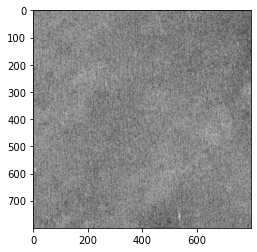

prediction:  1


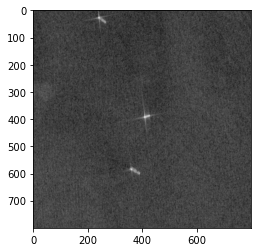

prediction:  1


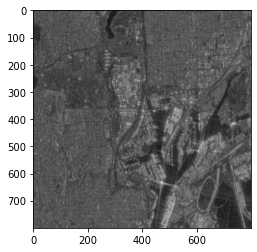

prediction:  1


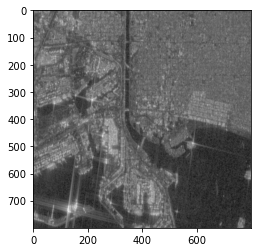

prediction:  1


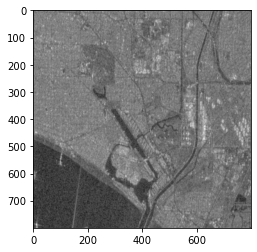

prediction:  1


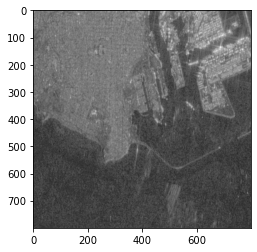

prediction:  1


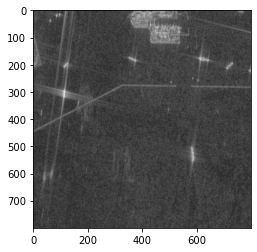

prediction:  1


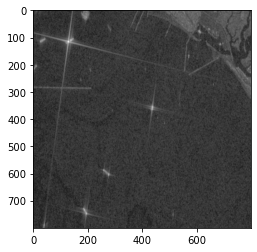

prediction:  1


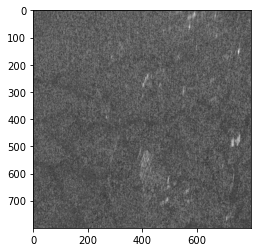

prediction:  1


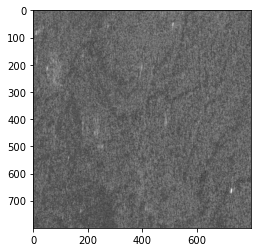

prediction:  1


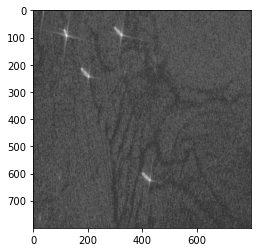

prediction:  1


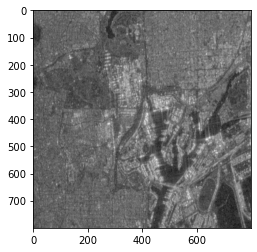

prediction:  1


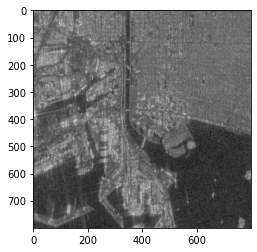

prediction:  1


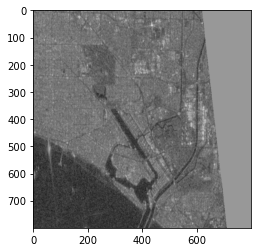

prediction:  1


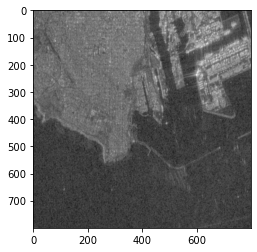

prediction:  1


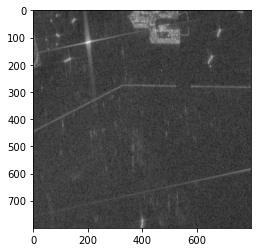

prediction:  1


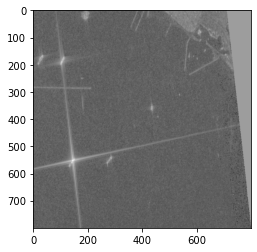

prediction:  1


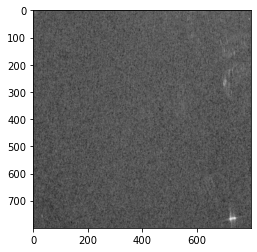

prediction:  1


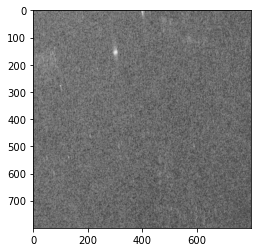

prediction:  1


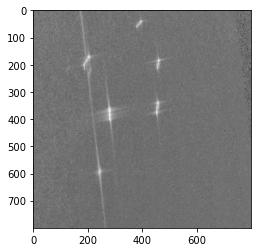

prediction:  1


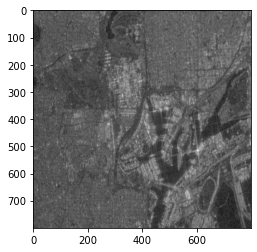

prediction:  1


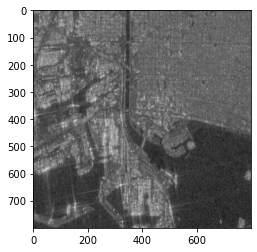

prediction:  1


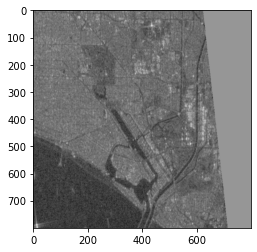

prediction:  1


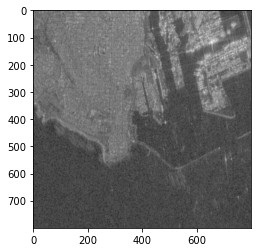

prediction:  1


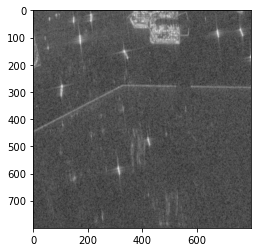

prediction:  1


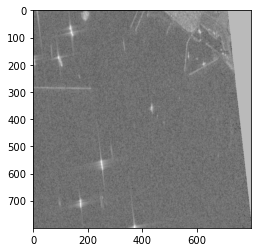

prediction:  1


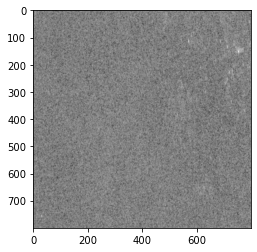

prediction:  1


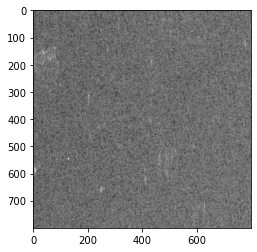

prediction:  1


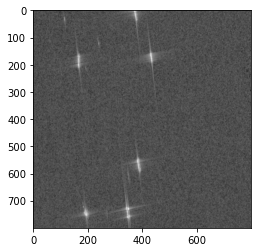

prediction:  1


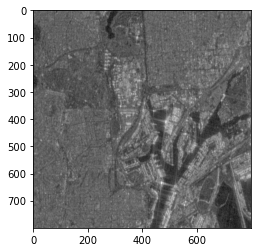

prediction:  1


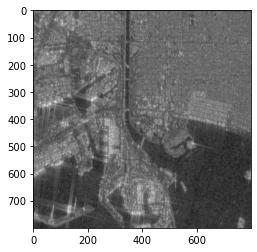

prediction:  1


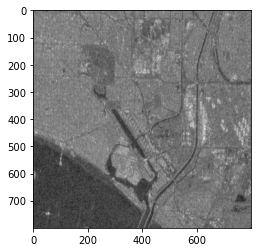

prediction:  0


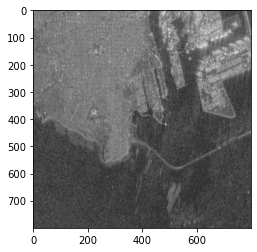

prediction:  1


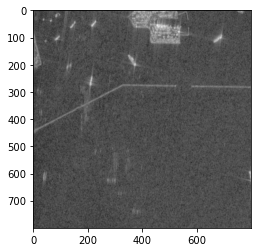

prediction:  1


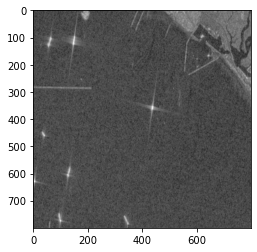

prediction:  1


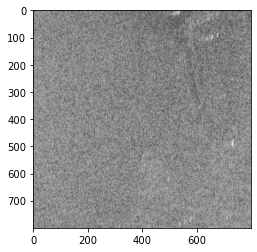

prediction:  1


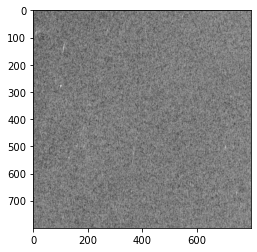

prediction:  1


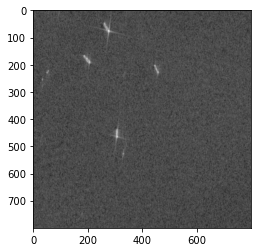

prediction:  1


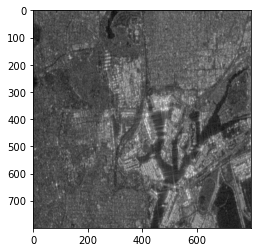

prediction:  1


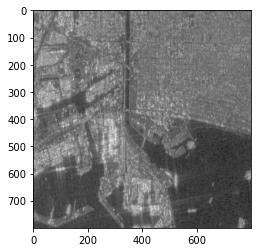

prediction:  1


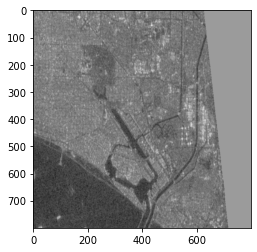

prediction:  1


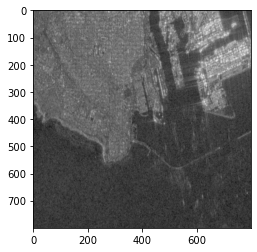

prediction:  1


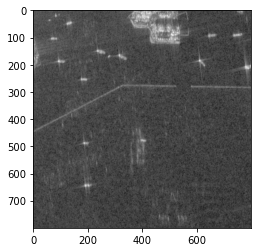

prediction:  1


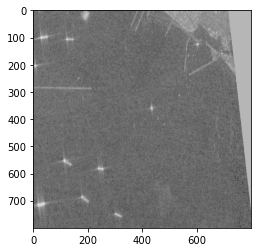

prediction:  1


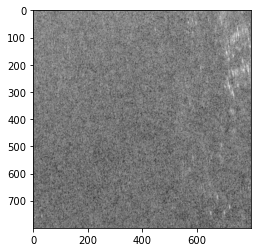

prediction:  1


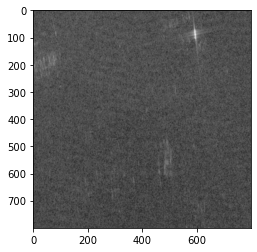

prediction:  1


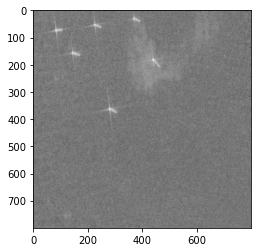

prediction:  1


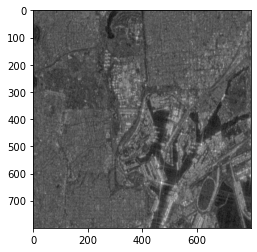

prediction:  1


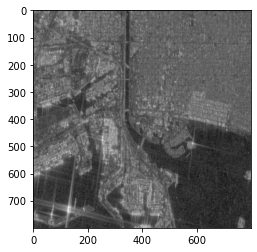

prediction:  1


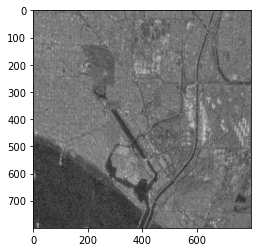

prediction:  1


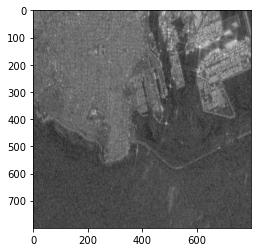

prediction:  1


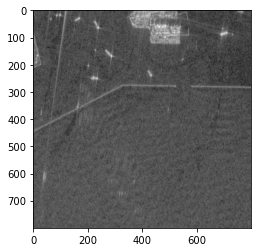

prediction:  1


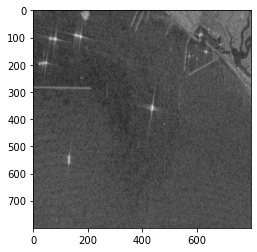

prediction:  1


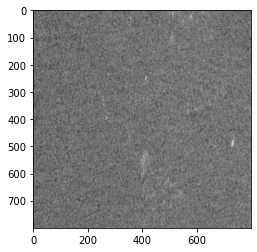

prediction:  1


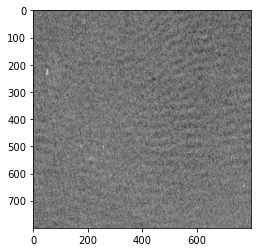

prediction:  1


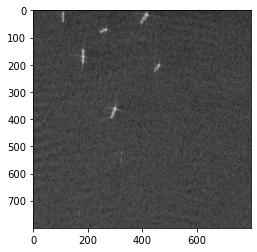

prediction:  1


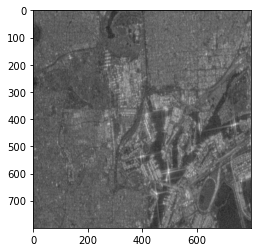

prediction:  1


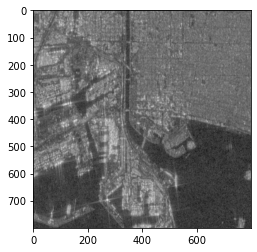

prediction:  1


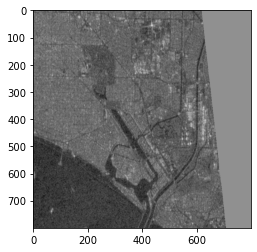

prediction:  1


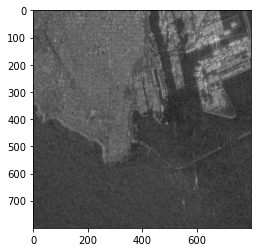

prediction:  1


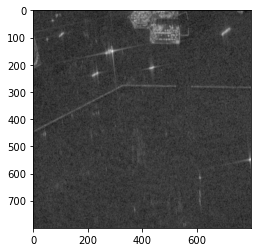

prediction:  1


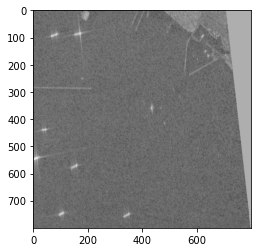

prediction:  1


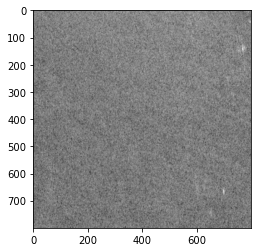

prediction:  1


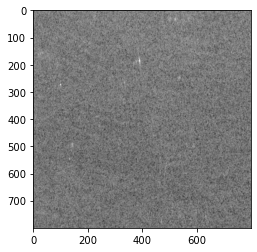

prediction:  1


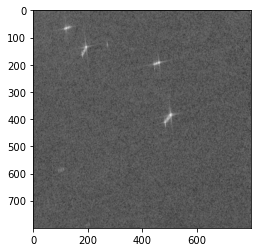

prediction:  1


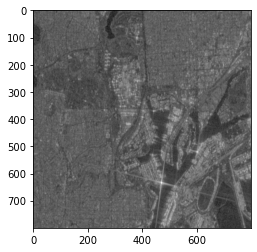

prediction:  1


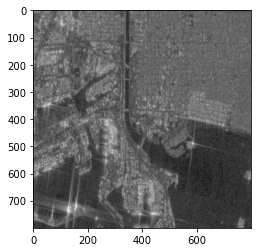

prediction:  1


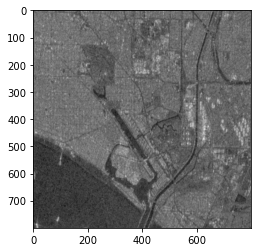

prediction:  1


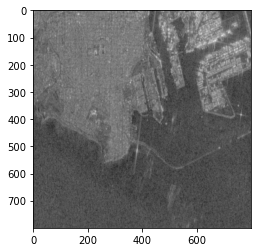

prediction:  1


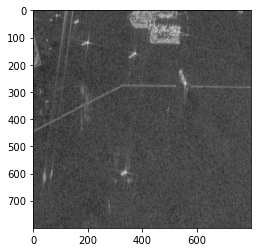

prediction:  1


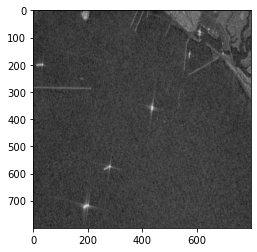

prediction:  1


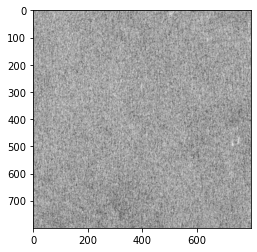

prediction:  1


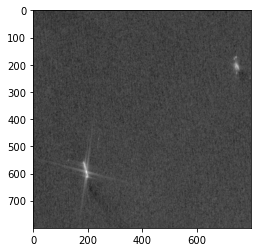

prediction:  1


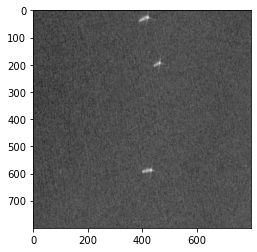

prediction:  1


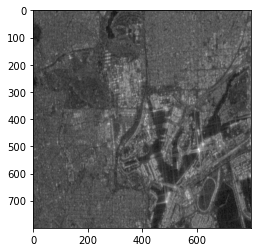

prediction:  1


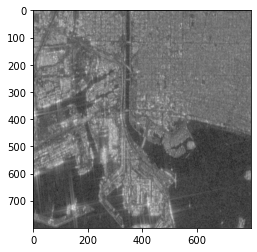

prediction:  1


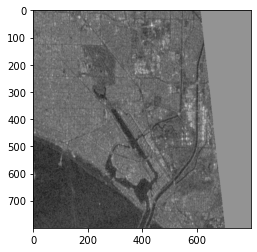

prediction:  1


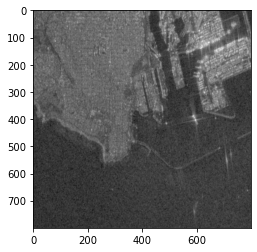

prediction:  1


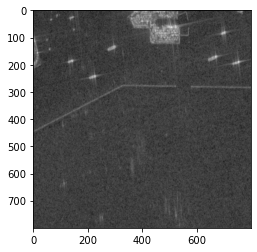

prediction:  1


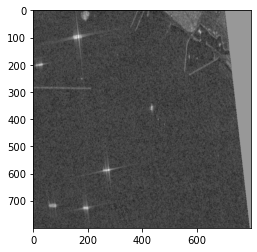

prediction:  1


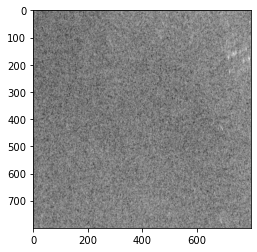

prediction:  1


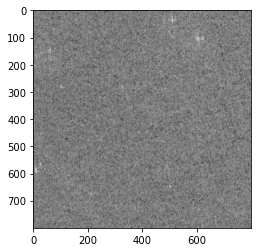

prediction:  1


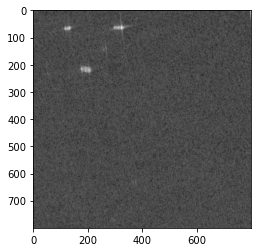

prediction:  1


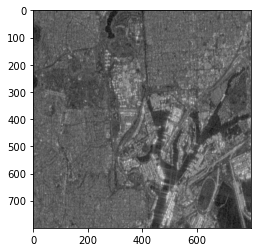

prediction:  1


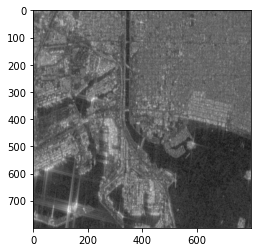

prediction:  1


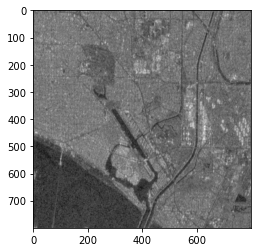

prediction:  1


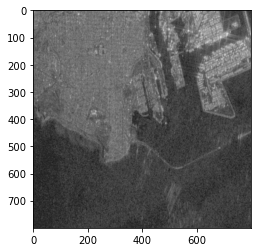

prediction:  1


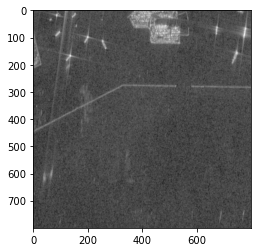

prediction:  1


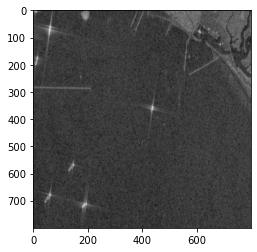

prediction:  1


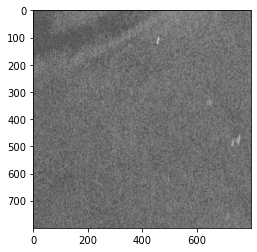

prediction:  1


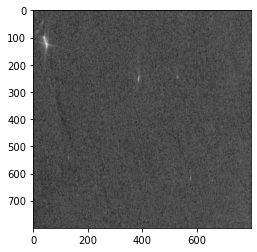

prediction:  1


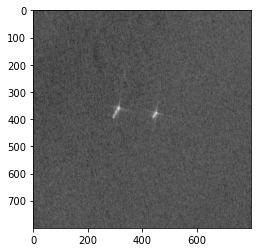

In [30]:
for i in range(len(preds)):
    print('prediction: ', preds[i])
    plt.imshow(sub_imgs[i],cmap='gray')
    plt.show()